# **Product Recognition of Books**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it

Computer vision-based object detection techniques can be applied in library or bookstore settings to build a system that identifies books on shelves.

Such a system could assist in:
* Helping visually impaired users locate books by title/author;
* Automating inventory management (e.g., detecting misplaced or out-of-stock books);
* Enabling faster book retrieval by recognizing spine text or cover designs.

## Task
Develop a computer vision system that, given a reference image for each book, is able to identify such book from one picture of a shelf.

<figure>
<a href="https://ibb.co/pvLVjbM5"><img src="https://i.ibb.co/svVx9bNz/example.png" alt="example" border="0"></a>
</figure>

For each type of product displayed on the shelf, the system should compute a bounding box aligned with the book spine or cover and report:
1. Number of instances;
1. Dimension of each instance (area in pixel of the bounding box that encloses each one of them);
1. Position in the image reference system of each instance (four corners of the bounding box that enclose them);
1. Overlay of the bounding boxes on the scene images.

<font color="red"><b>Each step of this assignment must be solved using traditional computer vision techniques.</b></font>

#### Example of expected output
```
Book 0 - 2 instance(s) found:
  Instance 1 {top_left: (100,200), top_right: (110, 220), bottom_left: (10, 202), bottom_right: (10, 208), area: 230px}
  Instance 2 {top_left: (90,310), top_right: (95, 340), bottom_left: (24, 205), bottom_right: (23, 234), area: 205px}
Book 1 – 1 instance(s) found:
.
.
.
```

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify;
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios.

## Evaluation criteria
1. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

2. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed and justified approach that solves more or all instances.

In [2]:
import cv2
import numpy as np
import glob
import re
import os
import matplotlib.pyplot as plt

The first step is to load and extract the dataset with the models and scenes images.

In [3]:
from google.colab import drive
drive.mount('/content/drive')
!cp -r /content/drive/MyDrive/LabSessionsIPCV/dataset.zip ./
!unzip dataset.zip

Mounted at /content/drive
Archive:  dataset.zip
   creating: dataset/
   creating: dataset/scenes/
  inflating: dataset/.DS_Store       
  inflating: __MACOSX/dataset/._.DS_Store  
   creating: dataset/models/
  inflating: dataset/scenes/scene_9.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_9.jpg  
  inflating: dataset/scenes/scene_8.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_8.jpg  
  inflating: dataset/scenes/scene_20.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_20.jpg  
  inflating: dataset/scenes/scene_21.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_21.jpg  
  inflating: dataset/scenes/scene_23.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_23.jpg  
  inflating: dataset/scenes/scene_22.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_22.jpg  
  inflating: dataset/scenes/scene_26.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_26.jpg  
  inflating: dataset/scenes/scene_27.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_27.jpg  
  inflating: datas

Load all the images from the extracted folders, skipping the Mac files (I worked on Windows) and define a method natural_sort_key to order the images by
their index (0 up to 28 for scenes and 0 up to 21 for models).

In [4]:
# Load images
def load_images_from_folder(folder, extensions=("*.png", "*.jpg", "*.jpeg")):
    """
    Load all images from a folder and convert them to grayscale.
    Uses only the file name as dictionary key.
    """
    images = {}
    for ext in extensions:
        for filename in glob.glob(os.path.join(folder, ext)):
            # Skip hidden Mac files
            if os.path.basename(filename).startswith("."):
                continue
            img = cv2.imread(filename)
            if img is not None:
                gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                # Use just the filename as key
                images[os.path.basename(filename)] = gray_img
    return images


def natural_sort_key(filename):
    """Extract numeric part to order the filenams numerically"""
    match = re.search(r"(\d+)", filename)
    return int(match.group(1)) if match else float("inf")


This method is used to retain only the most regular bounding boxes and discard those that are not accurate enough to be considered good detections of books. It takes as input the four corners of a generated bounding box and performs a series of checks. First, it verifies that there are exactly four points. Next, it computes the area of the bounding box defined by these corners. It then calculates another area using minAreaRect, which finds the minimum-area rotated rectangle enclosing the points. The purpose of this step is to compare the two areas: if their ratio is sufficiently high (greater than 0.8), the bounding box is considered a good approximation; otherwise, it is discarded.

In [5]:
def is_valid_book_bbox(corners, max_aspect_ratio=3.0,  min_area_ratio=0.8):
    """
    Checks if a bounding box is a valid rectangle for book detection.
    This version is robust against perspective distortion and minor inaccuracies.

    Parameters:
        corners: A list of 4 corner points [(x1,y1), (x2,y2), (x3,y3), (x4,y4)].
        max_aspect_ratio: The maximum allowed width/height ratio.
        min_area: The minimum allowed area in pixels^2.
        min_area_ratio: The minimum ratio of the contour area to the min area rectangle area.

    Returns:
        bool: True if the bounding box is a valid book rectangle, False otherwise.
    """

    # 1. Basic validation: ensure there are exactly 4 points.
    if len(corners) != 4:
        return False

    pts = np.array(corners, dtype=np.float32)

    area = cv2.contourArea(pts)

    # 2. Aspect Ratio and Rectangularity Check
    # We use cv2.minAreaRect() for a robust check. It finds the smallest possible
    # rectangle that encloses the 4 points, which is a great reference.
    rect = cv2.minAreaRect(pts)
    width, height = rect[1]

    # Avoid division by zero
    if min(width, height) == 0:
        return False

    # 3. Area Ratio Check (The key to robustness)
    # A true rectangle's area will be very close to its minAreaRect's area.
    # A trapezoid or other distorted shape will have a much smaller area.
    rect_area = width * height
    if rect_area == 0:
        return False

    area_ratio = area / rect_area
    # A low ratio means the shape is not a good rectangle.
    if area_ratio < min_area_ratio:
        return False

    return True

This method applies a set of transformations to preprocess the image and make it more suitable for extracting robust SIFT features, especially under challenging lighting conditions. The goal is to normalize overall brightness, enhance local contrast, and suppress reflections that could interfere with keypoint detection. The final result is a more balanced grayscale image that improves the stability and accuracy of feature matching.

1. Grayscale conversion

    Even if images are already turned grey in the load_folder method, this is implemented anyway in case that method is not used. Converting to a single-channel grayscale image removes color information and produces a luminance-like signal that SIFT expects. SIFT descriptors and keypoint detection rely on gradients and intensity changes, not color, so working on a consistent intensity channel reduces variance introduced by chromatic differences and simplifies subsequent processing.

2. Optional upscaling (interpolation)

    Upscaling with INTER_CUBIC increases image resolution (it's costly), so SIFT can localize keypoints and sample descriptors more precisely, especially for small printed text or fine book textures. I upscaled the image with a scale_factor of 3.0 because this was the value that let SIFT to find more interesting keypoints. Upscaling effectively shifts features into SIFT’s detectable scale range, increasing the number of repeatable keypoints and improving descriptor distinctiveness.

3. Adaptive gamma correction

    Purpose: correct global exposure so gradients are well-distributed. Very dark images have most pixel values near 0 so gradients are weak; very bright images saturate near 255 losing contrast. Gamma correction remaps intensity nonlinearly to boost midtones or compress highlights.

4. CLAHE (Contrast Limited Adaptive Histogram Equalization)
    Purpose: increase local contrast so small, low-contrast features (book spines, text, embossed logos) become more visible for keypoint detectors and descriptors. CLAHE works on tiles (tileGridSize) and limits contrast amplification via clipLimit, preventing over-amplification of noise and avoiding the “washed out” look of global histogram equalization.

5. Reflection (specular highlight) suppression

    Purpose: specular highlights are tiny saturated regions with near-flat, very high intensity; they destroy gradient structure and produce unreliable keypoints and descriptors. Detection is typically done by thresholding for very bright pixels (e.g., >240) to form a binary mask, then filling those pixels by inpainting.

In [6]:
def preprocess_image(image, clip_limit=2.5, scale_factor=3.0):
    """
    Adaptive preprocessing for SIFT robustness under illumination changes.

    Steps:
      1. Convert to grayscale
      2. Optional upscaling (for better keypoint localization)
      3. Adaptive gamma correction (too dark/too bright images)
      4. CLAHE for local contrast enhancement
      5. Reflection suppression (very bright spots)

    Returns:
        Enhanced grayscale image
    """
    # --- 1. Convert to grayscale if needed ---
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()

    # --- 2. Upscale for more details ---
    if scale_factor != 1.0:
        gray = cv2.resize(
            gray,
            None,
            fx=scale_factor,
            fy=scale_factor,
            interpolation=cv2.INTER_CUBIC
        )

    # --- 3. Adaptive gamma correction ---
    mean_val = np.mean(gray)
    gamma = 1.0
    if mean_val < 80:       # Image too dark -> brighten
        gamma = 0.8
    elif mean_val > 170:    # Image too bright -> darken
        gamma = 1.6

    if gamma != 1.0:
        inv_gamma = 1.0 / gamma
        table = np.array([(i / 255.0) ** inv_gamma * 255
                          for i in np.arange(256)]).astype("uint8")
        gray = cv2.LUT(gray, table)

    # --- 4. Apply CLAHE for local contrast ---
    gray = apply_clahe(gray, clip_limit=clip_limit)

    # --- 5. Reflection suppression ---
    # Detect very bright areas (potential specular highlights)
    mask_reflections = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY)[1]
    if np.sum(mask_reflections) > 0:  # only if reflections exist
        gray = cv2.inpaint(gray, mask_reflections, 3, cv2.INPAINT_TELEA)

    return gray


def apply_clahe(image, clip_limit=2.5):
    """Apply Contrast Limited Adaptive Histogram Equalization"""
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=(8, 8))
    return clahe.apply(image)


This function is designed to detect multiple occurrences of a reference image within a larger scene using SIFT features, feature matching, and homography estimation.

First, both the model image and the scene image are preprocessed to enhance robustness. Then, SIFT is applied to the model image to extract its distinctive keypoints and descriptors, which serve as the reference for matching.

The algorithm proceeds iteratively. At each iteration, SIFT features are extracted from the current state of the scene. Feature matching is performed between the model descriptors and the scene descriptors using a FlannBasedMatcher combined with Lowe’s ratio test, ensuring that only reliable correspondences are retained. I tried values between 0.7 and 0.8, but with 0.7 it's too strict and with 0.8 we have too many keypoints. That's why I reckon that 0.75 is the perfect value for this task. Anyway, if the number of good matches is sufficient, these correspondences are used to compute a homography matrix with RANSAC, which estimates the geometric transformation between the model and the detected region in the scene even with noisy data. This means estimating a homography from good matches while identifying and discarding the wrong ones.

Using this homography, the corners of the model image are projected into the scene to obtain the bounding box of the detected instance. The area of this quadrilateral is computed, and the bounding box is validated by the function described before to discard unreliable or degenerate detections. If the detection passes these checks, it is stored as a new instance, including its corner coordinates and area.

After each detection, the corresponding region is masked out of the scene image so that subsequent iterations can search for additional instances without interference. The process continues until no further valid detections can be found.

The output is a list of detected instances, each represented by the coordinates of its bounding box and its area in pixels. When debugging is enabled, the function also produces visualizations of keypoints, matches, bounding boxes, and the progression of detections across iterations.

In [16]:
def detect_instances_sift(model_img, scene_img, min_matches=30, debug=False):
    """
    Detect multiple instances of model_img inside scene_img using
    SIFT + feature matching + RANSAC homography estimation.

    Parameters:
        model_img -> reference image of the object to detect
        scene_img -> full image containing multiple instances
        min_matches -> minimum number of good matches required
        debug -> if True, display debugging visualizations

    Returns:
        instances (list of dicts), where each dict contains:
            - corners: list of 4 (x,y) points of the bounding box
            - area: area in pixels of the bounding box
    """
    model_img = preprocess_image(model_img)
    scene_img = preprocess_image(scene_img)

    # --- Step 1: Feature extraction with SIFT ---
    sift = cv2.SIFT_create(contrastThreshold=0.01)
    kp_m, des_m = sift.detectAndCompute(model_img, None)

    if des_m is None:
        print("DEBUG: No descriptors found in model image")
        return []

    current_scene = scene_img.copy()
    instances = []
    iteration = 0

    # Debug visualization of model keypoints
    if debug:
        model_with_kp = cv2.drawKeypoints(
            model_img, kp_m, None,
            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
        )
        plt.figure(figsize=(10, 6))
        plt.imshow(model_with_kp, cmap='gray')
        plt.title(f'Model Keypoints: {len(kp_m)}')
        plt.axis('off')
        plt.show()

    # --- Step 2: Iterative detection of multiple instances ---
    while True:
        iteration += 1
        if debug:
            print(f"\n--- Iteration {iteration} ---")

        # Detect features using the current mask
        kp_s, des_s = sift.detectAndCompute(current_scene, None)

        if des_s is None or len(kp_s) < min_matches:
            if debug:
                print(f"DEBUG: Not enough keypoints in scene ({len(kp_s) if kp_s else 0})")
            break

        if debug:
            print(f"DEBUG: Scene keypoints: {len(kp_s)}")

        # Feature matching with Lowe's ratio test
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        # Initializing matcher
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        # Matching and finding the 2 closest elements for each model descriptor
        matches = flann.knnMatch(des_m, des_s, k=2)
        good = [m for m, n in matches if m.distance < 0.75 * n.distance]

        if debug:
            print(f"DEBUG: Good matches found: {len(good)}")

        if len(good) < min_matches:
            if debug:
                print("DEBUG: Not enough good matches")
            break

        # Debug: show matches (only first iteration)
        if debug:
            match_img = cv2.drawMatches(
                model_img, kp_m, scene_img, kp_s, good, None,
                flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
            )
            plt.figure(figsize=(15, 8))
            plt.imshow(match_img, cmap='gray')
            plt.title(f'Good Matches: {len(good)}')
            plt.axis('off')
            plt.show()

        # Estimate homography with RANSAC
        src_pts = np.float32([kp_m[m.queryIdx].pt for m in good]).reshape(-1,1,2)
        dst_pts = np.float32([kp_s[m.trainIdx].pt for m in good]).reshape(-1,1,2)
        H, mask_H = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        if H is None:
            if debug:
                print("DEBUG: Homography estimation failed")
            break

        # --- Project reference corners to scene coordinates ---
        # Get model dimensions
        h, w = model_img.shape[:2]

        # Define model corners (top-left, top-right, bottom-right, bottom-left)
        box = np.float32([[0,0],[w,0],[w,h],[0,h]]).reshape(-1,1,2)

        # Transform model corners to scene coordinates using homography
        projected = cv2.perspectiveTransform(box, H)

        # Calculate area of the projected quadrilateral
        area = cv2.contourArea(projected)

        corners = projected.reshape(4,2).astype(int).tolist()

        # Validate bounding box
        if not is_valid_book_bbox(corners):
            if debug:
              print("DEBUG: Discarded bounding box (not rectangular enough)")
            cv2.fillPoly(current_scene, [np.int32(corners)], (255, 255, 255))
            break

        # Store instance
        if area < 100:
            if debug:
              print("DEBUG: Discarded bounding box (area too small)")
        else:
            instances.append({"corners": corners, "area": int(area)})

        if debug:
            print(f"DEBUG: Instance found (area={area})")
            print(f"DEBUG: Corners: {corners}")

        # Update mask to exclude the detected instance for next iteration
        cv2.fillPoly(current_scene, [np.int32(corners)], (255, 255, 255))

        # Debug visualization of progress
        if debug:
            plt.figure(figsize=(12, 6))
            plt.subplot(121)
            plt.imshow(current_scene, cmap='gray')
            plt.title(f'Mask after iteration {iteration}')
            plt.axis('off')

            scene_with_boxes = scene_img.copy()
            for inst in instances:
                pts = np.array(inst["corners"]).reshape((-1, 1, 2))
                cv2.polylines(scene_with_boxes, [pts.astype(int)], True, 255, 2)
            plt.subplot(122)
            plt.imshow(scene_with_boxes, cmap='gray')
            plt.title('Detected instances so far')
            plt.axis('off')
            plt.tight_layout()
            plt.show()

    if debug:
        print(f"\nDEBUG: Total instances found: {len(instances)}")

    return instances


Load all the images of models and scenes

In [8]:
models_path = "/content/dataset/models"
scenes_path = "/content/dataset/scenes"

models = load_images_from_folder(models_path)
scenes = load_images_from_folder(scenes_path)

This block of code performs the main loop where each scene is analyzed against every model, detections are collected, and results are visualized.

First, the models and scenes dictionaries are sorted using a natural sorting key, ensuring that items are processed in ascending order according to their filenames. A predefined set of colors is prepared to distinguish bounding boxes from different models during visualization.

For each scene, a color copy of the image is loaded so that the detected bounding boxes can be drawn on it without altering the grayscale version used for feature extraction. The code then iterates over all models, applying the detection function to locate every instance of the current model inside the current scene.

For each detection, the bounding box coordinates are rescaled to the original image dimensions by reversing the scale factor applied during preprocessing. The coordinates of the four corners and the area of the bounding box are printed in a structured format, making the output easier to read and analyze. Simultaneously, the bounding box is drawn on the color scene image using one of the predefined colors, cycling through them as different models are processed.

After processing all models for a given scene, the annotated scene is displayed, showing all detected instances with their respective bounding boxes. This provides a clear visual summary of the detection results for that scene.


Processing Scene: scene_0.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0 

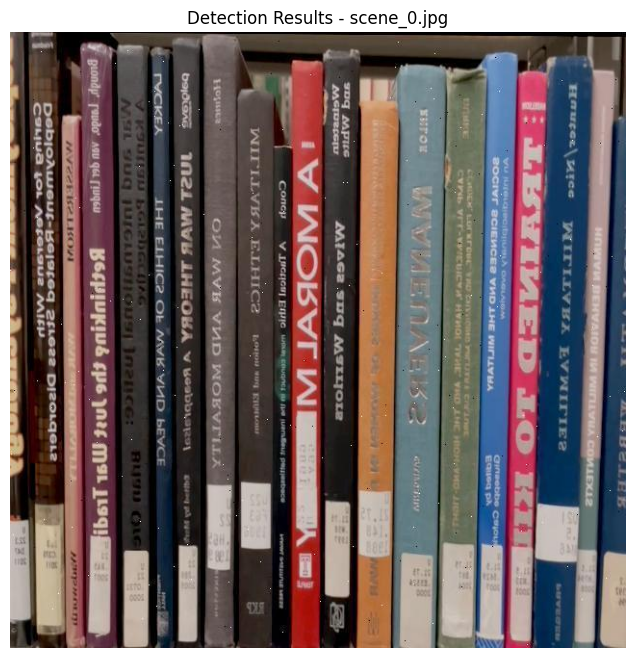


Processing Scene: scene_1.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 2 instance(s) found:
    Instance 1 {top_left: (np.float32(441.66666), np.float32(42.333332)), top

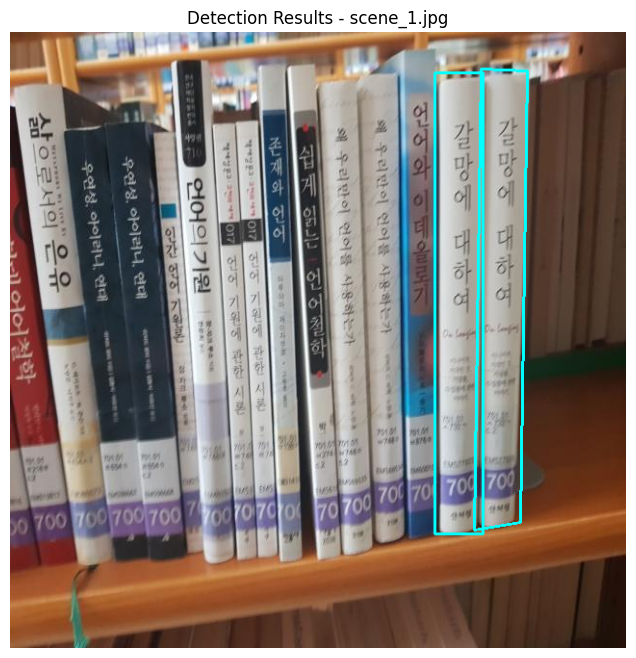


Processing Scene: scene_2.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 1 instance(s) found:
    Instance 1 {top_left: (np.float32(283.66666), np.float32(26.0)), top_right: (np.float32(318.66666), np.float32(25.0)), bo

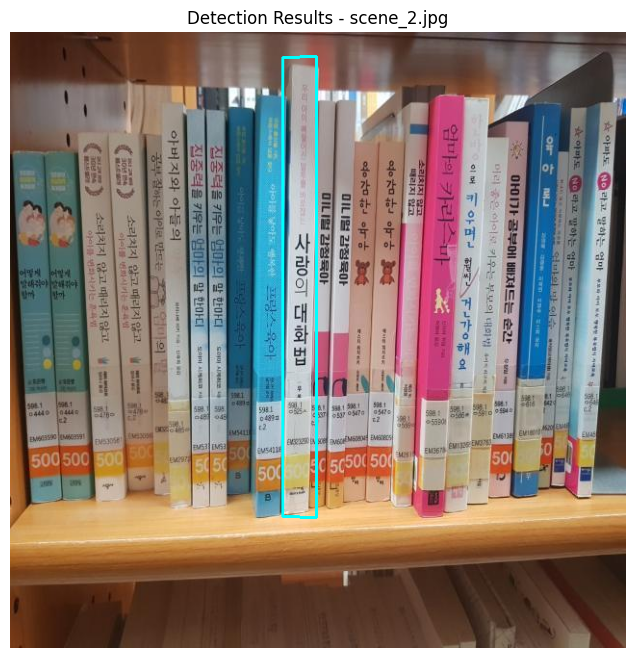


Processing Scene: scene_3.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 2 instance(s) found:
    Instance 1 {top_left: (np.float32(377.0), np.float32(209.33333)), top_right: (np.float32(426.0), np.float32(209.33333)), bottom_right: (np.float32(426.0), np.float32(542

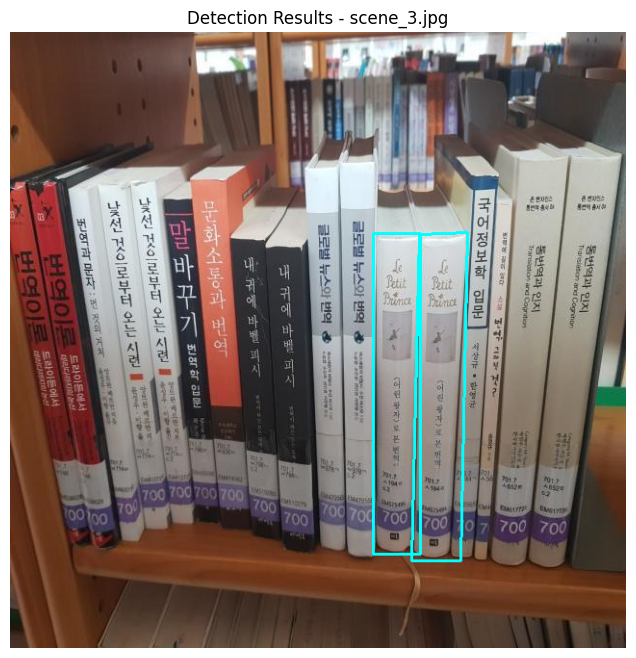


Processing Scene: scene_4.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 2 instance(s) found:
    Instance 1 {top_left: (np.float32(92.333336), np.float32(2.0)), top_right: (np.float32(135.66667), np.float32(2.0)), bottom_right: (np.float32(135.66667), np.float32(617.3333)), bottom_left: (np.float32(92.333336), np.float32(617.3333)), area: 241325px}
    Instanc

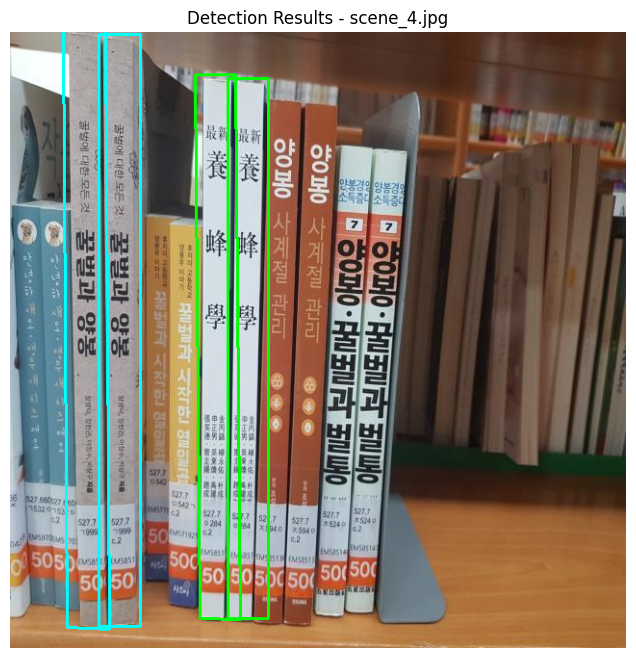


Processing Scene: scene_5.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 1 instance(s) found:
    Instance 1 {top_left: (np.float32(102.666664), np.float32(70.0)), top_right: (np.float32(146.33333), np.float32(70.0)), bottom_right: (np.float32(146.33333), np.float32(573.3333)), bottom_left: (np.float32(102.666664), np.float32(573.3333)), area: 197830px}
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 

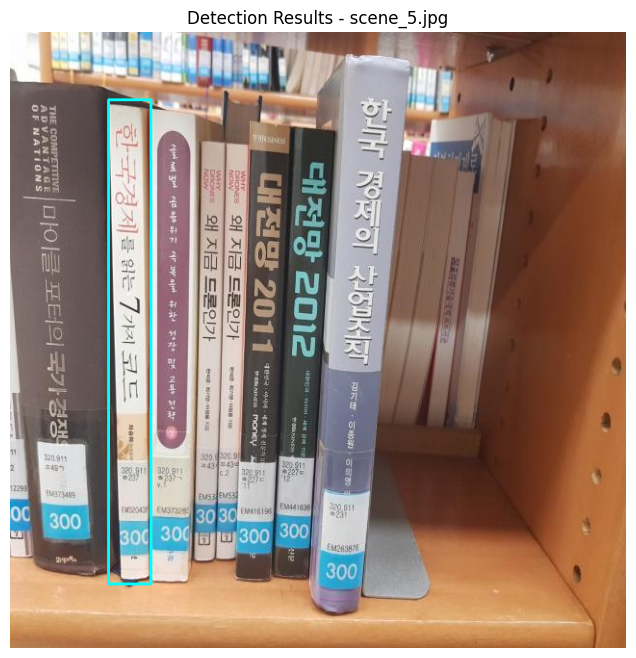


Processing Scene: scene_6.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0 

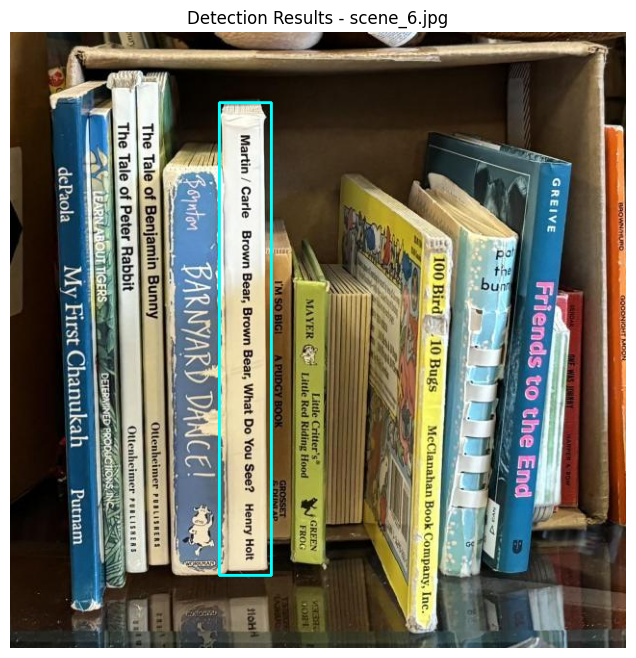


Processing Scene: scene_7.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 2 

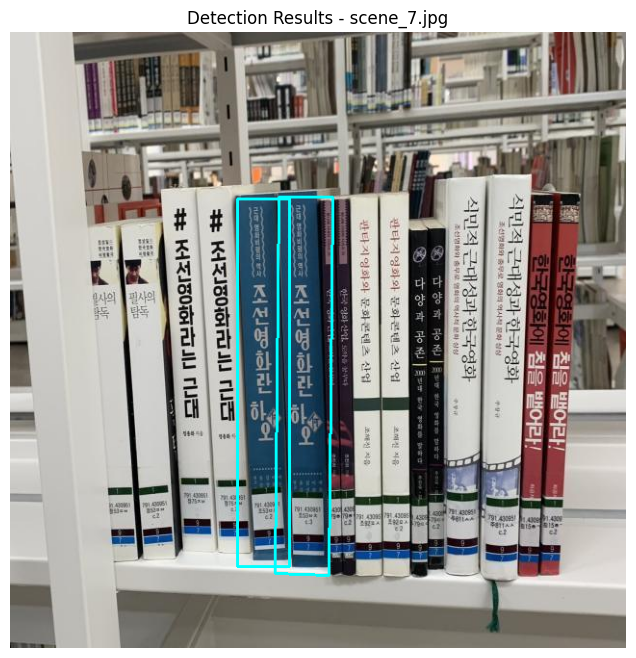


Processing Scene: scene_8.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0 

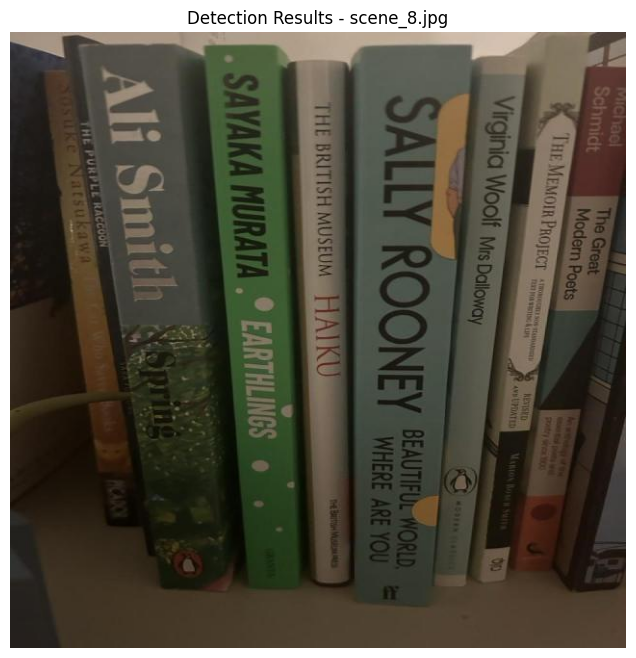


Processing Scene: scene_9.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 4 instance(s) found:
    Instance 1 {top_left: (np

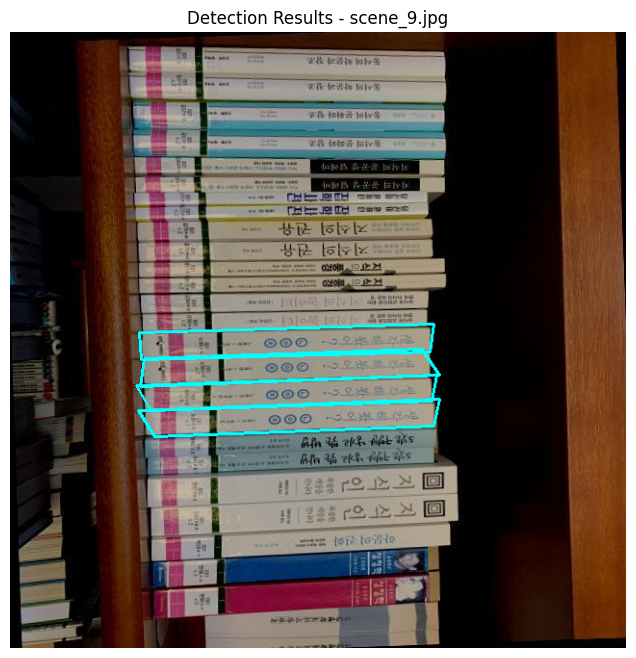


Processing Scene: scene_10.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 4 instance(s) found:
    Instance 1 {top_left: (n

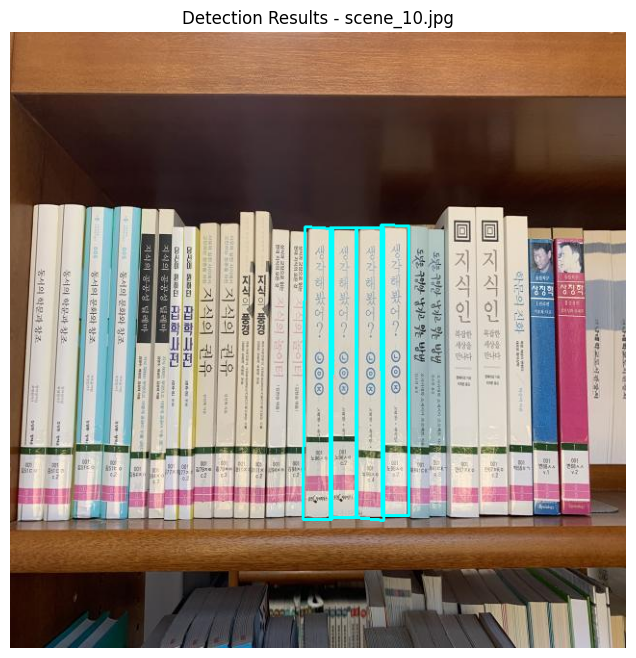


Processing Scene: scene_11.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0

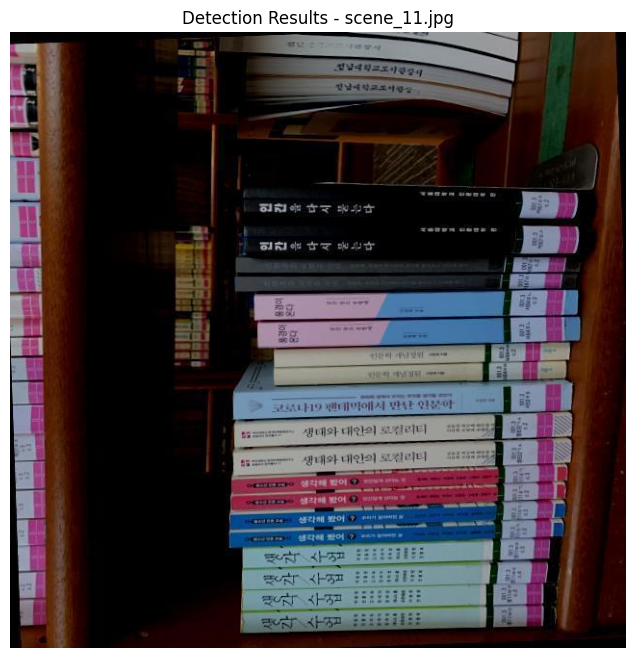


Processing Scene: scene_12.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0

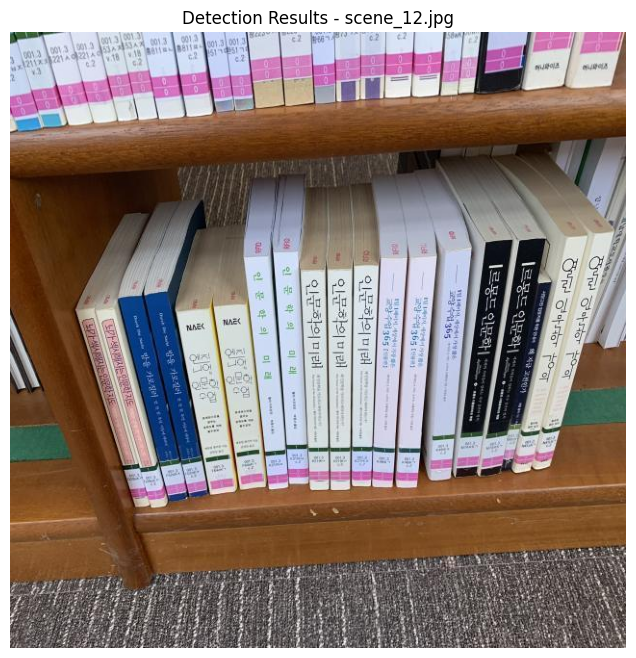


Processing Scene: scene_13.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0

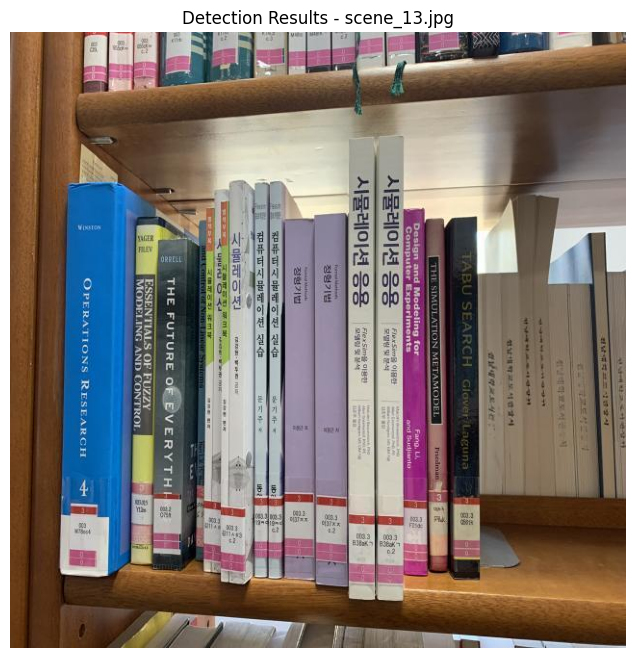


Processing Scene: scene_14.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0

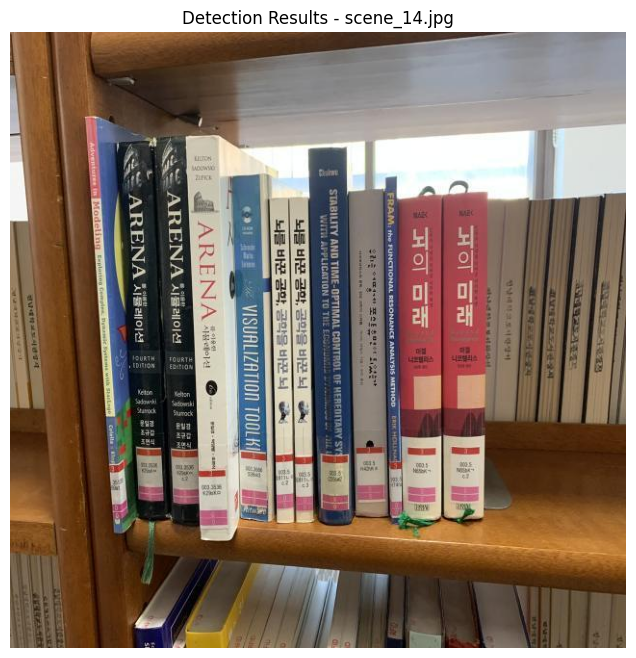


Processing Scene: scene_15.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 2 instance(s) found:
    Instance 1 {top_left: (np.float32(257.66666), np.float32(187.33333)), top_right: (np.float32(299.0), np.float32(188.0)), bottom_right: (np.float32(292.66666), np.float32(536.3333)), bottom_left: (np.float32(251.33333), np.float32(535.0)), area: 129780px}
    Instance 2 {top_left: (np.float32(217.66667), np.float32(184.33333)), top_right: (np.float32(260.66666), np.float32(186.33333)), bottom_right: (np.fl

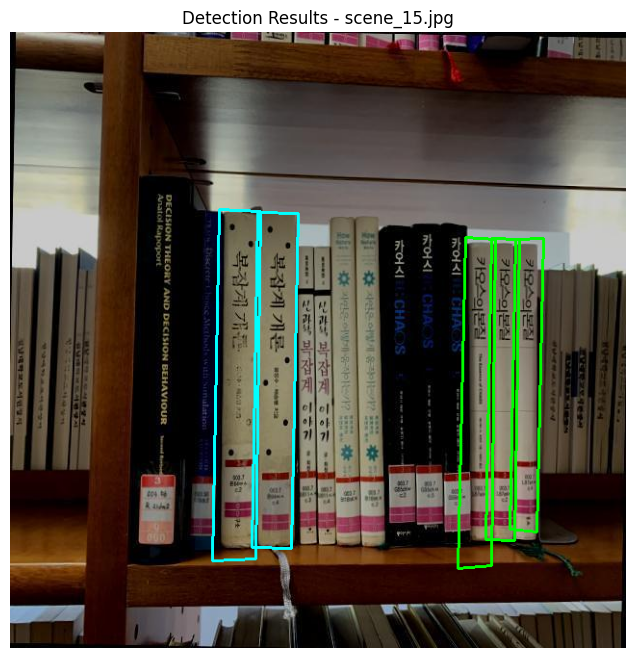


Processing Scene: scene_16.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 2 instance(s) found:
    Instance 1 {top_left: (np.float32(257.0), np.float32(187.66667)), top_right: (np.float32(299.0), np.float32(188.0)), bottom_right: (np.float32(293.33334), np.float32(536.0)), bottom_left: (np.float32(251.33333), np.float32(535.3333)), area: 131109px}
    Instance 2 {top_left: (np.float32(218.0), np.float32(184.33333)), top_right: (np.float32(260.66666), np.float32(186.33333)), bottom_right: (np.float32(25

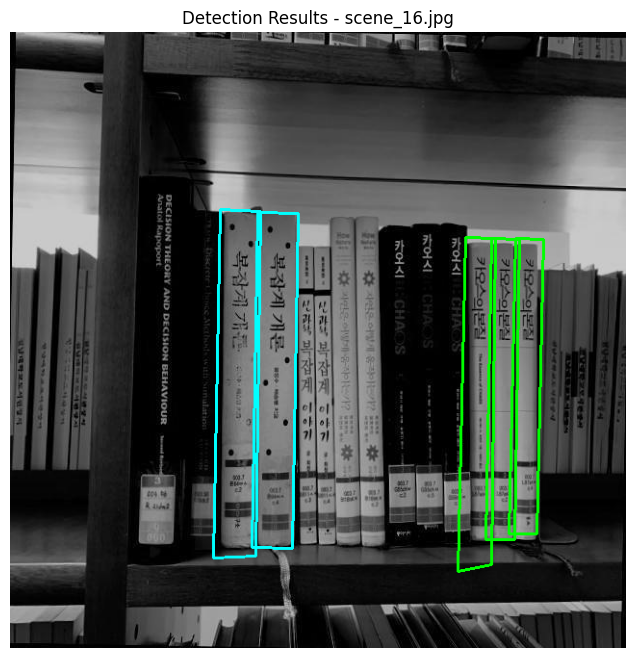


Processing Scene: scene_17.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 2 instance(s) found:
    Instance 1 {top_left: (np.float32(254.66667), np.float32(187.66667)), top_right: (np.float32(296.33334), np.float32(187.66667)), bottom_right: (np.float32(296.0), np.float32(536.0)), bottom_left: (np.float32(254.66667), np.float32(536.0)), area: 130074px}
    Instance 2 {top_left: (np.float32(214.66667), np.float32(182.33333)), top_right: (np.float32(258.0), np.float32(185.33333)), bottom_right: (np.float

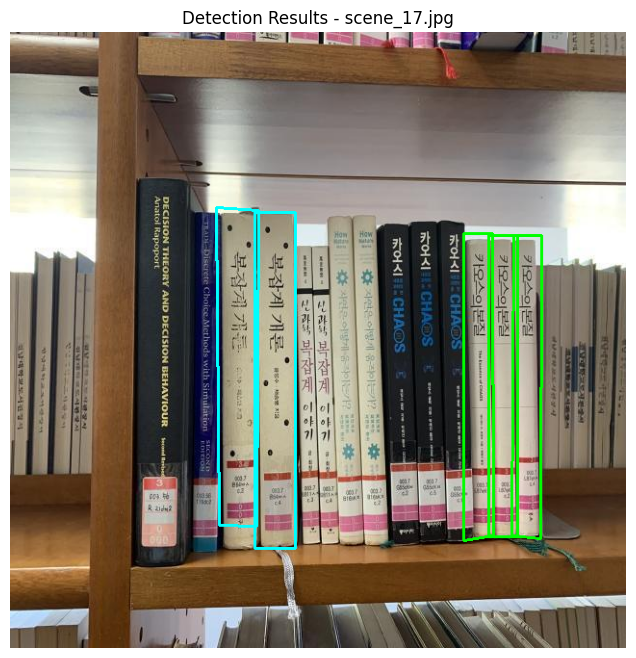


Processing Scene: scene_18.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 3 instance(s) found:
    Instance 1 {top_left: (np.float32(291.0), np.float32(131.0)), top_right: (np.float32(318.66666), np.float32(131.0)), bottom_right: (np.float32(318.33334), np.float32(587.3333)), bottom_left: (np.float32(291.0), np.float32(587.3333)), area: 113004px}
    Instance 2 {top_left: (np.float32(314.66666), np.float32(133.33333)), top_right: (np.float32(342.0), np.float32(133.66667)), bottom_right: (np.float32(344.33334), np.float32(586.6667)), bottom_left: (np.float32(316.66666), np.float32(588.6667)), area: 112729px}
    Instance 3 {top_left: (np.floa

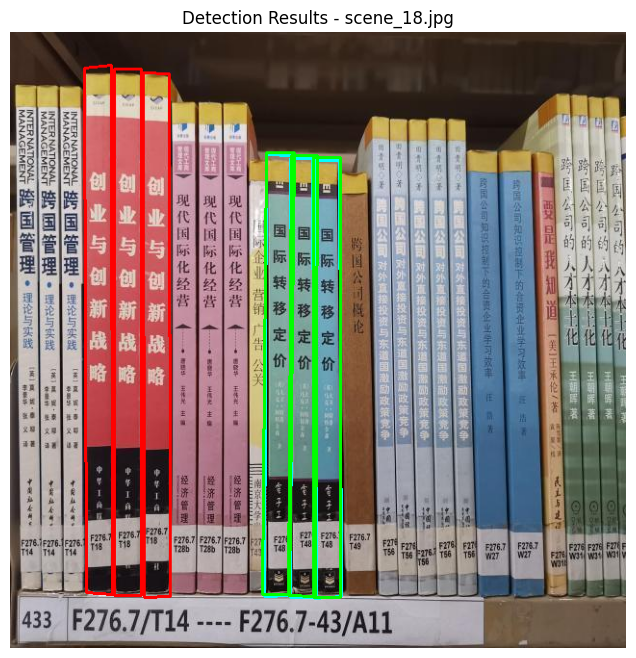


Processing Scene: scene_19.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 3 instance(s) found:
    Instance 1 {top_left: (np.float32(385.0), np.float32(32.0)), top_right: (np.float32(411.33334), np.float32(32.0)), bottom_right: (np.float32(411.33334), np.float32(579.6667)), bottom_left: (np.float32(385.0), np.float32(579.6667)), area: 130491px}
    Instance 2 {top_left: (np.float32(412.0), np.float32(32.666668)), top_right: (np.float32(438.0), np.float32(33.333332)), bottom_right: (np.float32(435.66666), np.float32(587.3333)), bottom_left: (np.float32(408.66666), np.float32(586.6667)), area: 131523px}
    Instance 3 {top_left: (np.float32(440.0), np.float32(34.666668)), top_right: (np.float32(465.33334), np.float32(26.666666)), bot

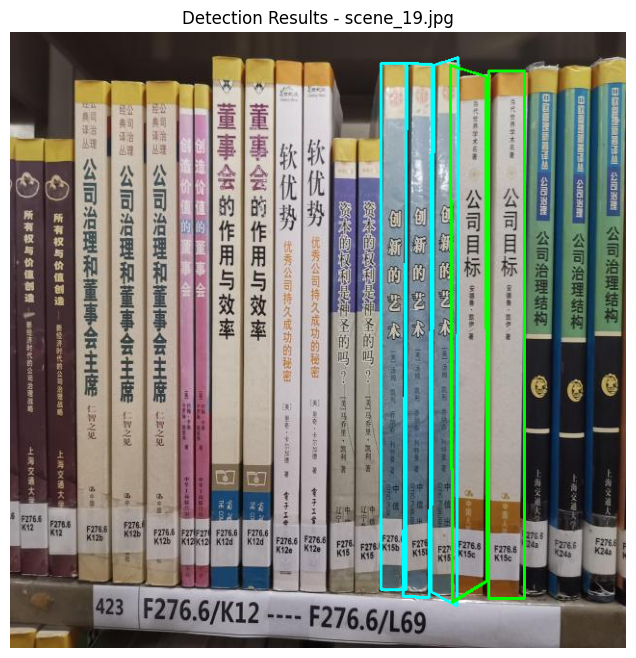


Processing Scene: scene_20.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0

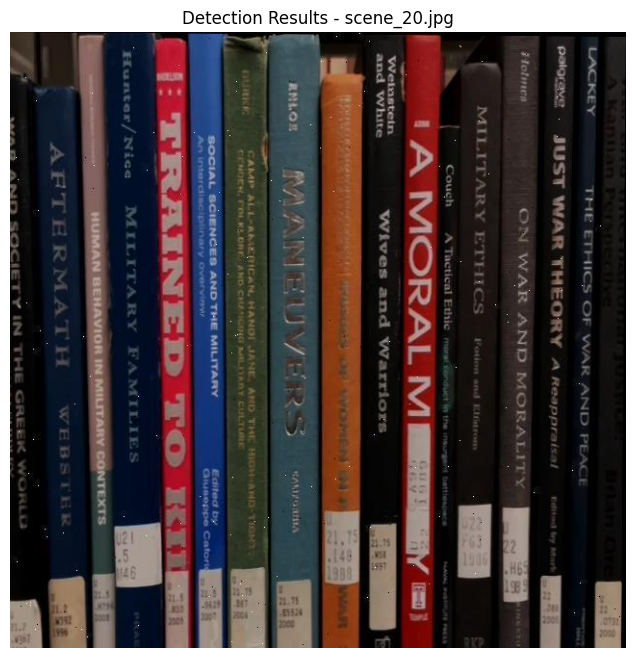


Processing Scene: scene_21.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0

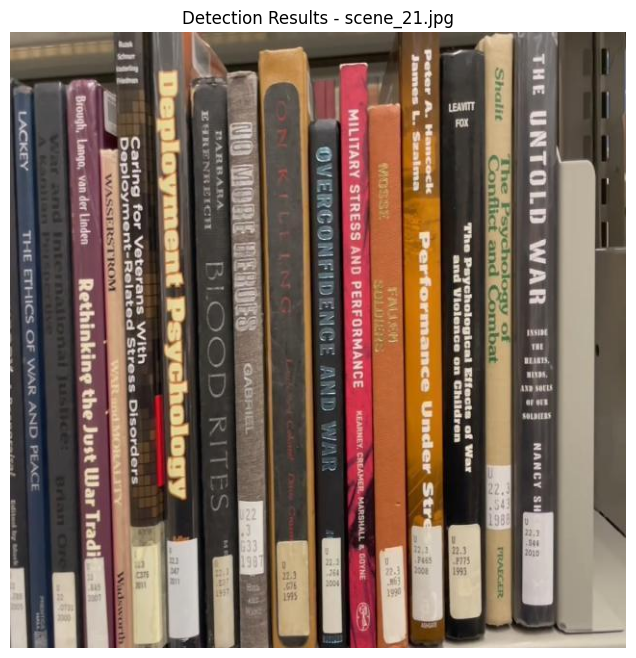


Processing Scene: scene_22.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0

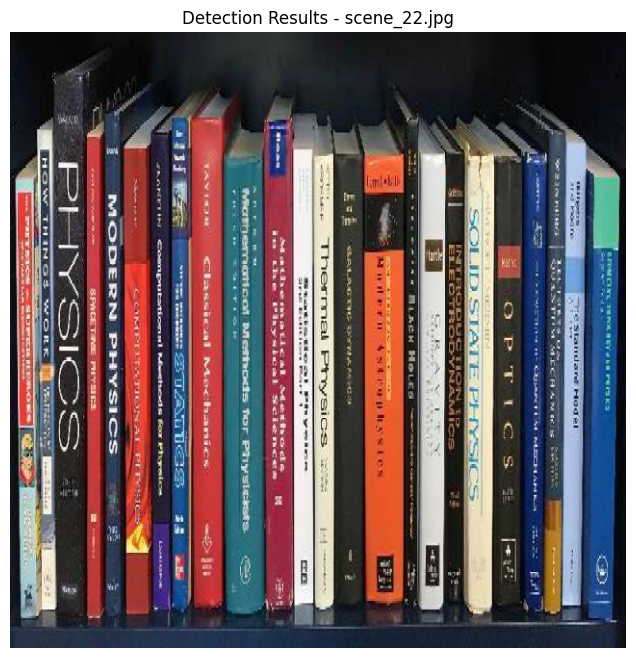


Processing Scene: scene_23.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 1 instance(s) found:
    Instance 1 {top_left: (np.float32(342.33334), np.float32(149.33333)), top_right: (np.float32(391.66666), np.float32(149.33333)), bottom_right: (np.float32(391.66666), np.float32(572.3333)), bottom_left: (np.float32(342.33334), np.float32(572.3333)), area: 187698px}
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found

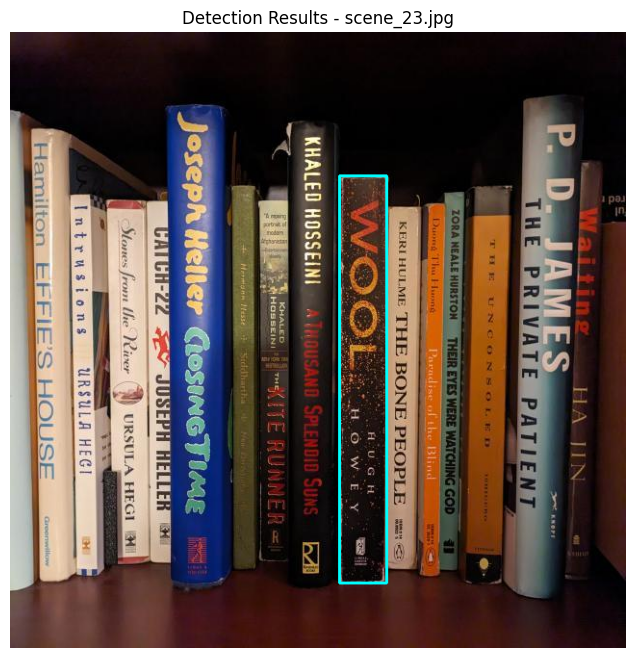


Processing Scene: scene_24.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0

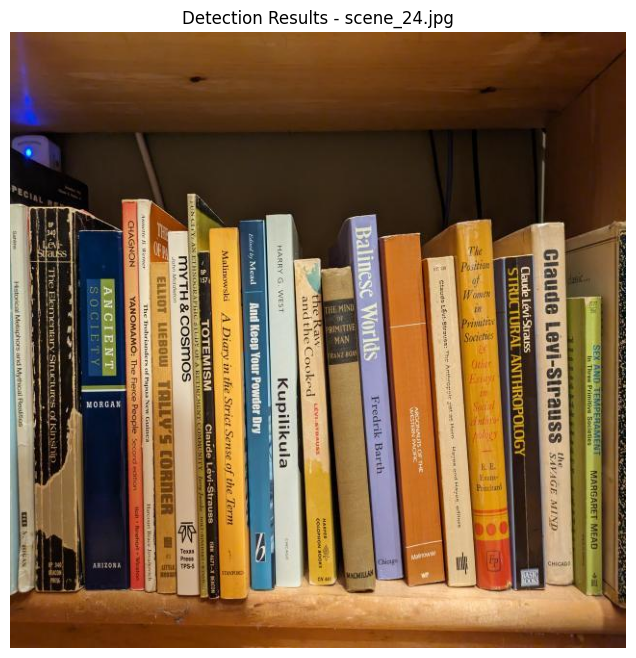


Processing Scene: scene_25.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) found:
  Book 10 (model_10.png) - 0 instance(s) found:
  Book 11 (model_11.png) - 0 instance(s) found:
  Book 12 (model_12.png) - 0 instance(s) found:
  Book 13 (model_13.png) - 0 instance(s) found:
  Book 14 (model_14.png) - 0 instance(s) found:
  Book 15 (model_15.png) - 0 instance(s) found:
  Book 16 (model_16.png) - 0 instance(s) found:
  Book 17 (model_17.png) - 0 instance(s) found:
  Book 18 (model_18.png) - 0 instance(s) found:
  Book 19 (model_19.png) - 0 instance(s) found:
  Book 20 (model_20.png) - 0

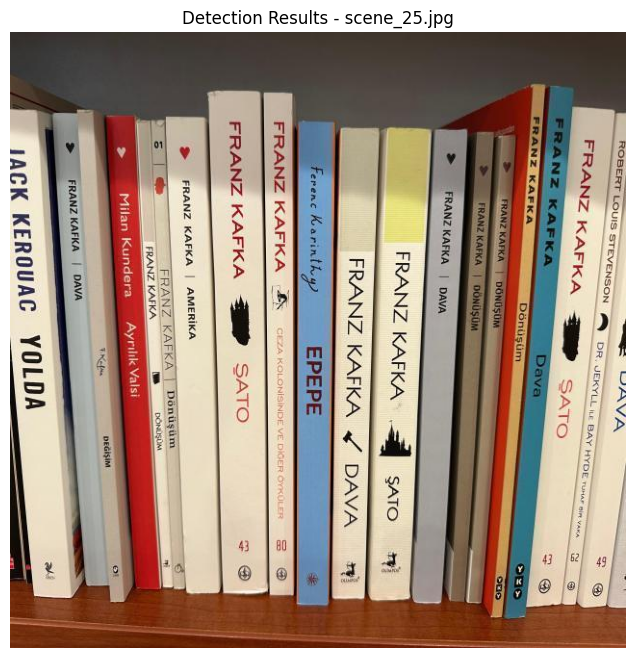


Processing Scene: scene_26.jpg
  Book 0 (model_0.png) - 2 instance(s) found:
    Instance 1 {top_left: (np.float32(210.0), np.float32(180.33333)), top_right: (np.float32(244.33333), np.float32(180.33333)), bottom_right: (np.float32(244.33333), np.float32(568.0)), bottom_left: (np.float32(210.0), np.float32(568.3333)), area: 119523px}
    Instance 2 {top_left: (np.float32(169.66667), np.float32(181.0)), top_right: (np.float32(204.66667), np.float32(182.33333)), bottom_right: (np.float32(210.0), np.float32(570.6667)), bottom_left: (np.float32(175.33333), np.float32(572.0)), area: 122644px}
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 1 instance(s) found:
    Instance 1 {top_left: (np.float32(248.33333), np.float32(183.0)), top_right: (np.float32(432.66666), np.float32(183.0)), bottom_right: (np.float32(432.66666), np.float32(526.6667)), bottom_left: (np.float32(248.33333

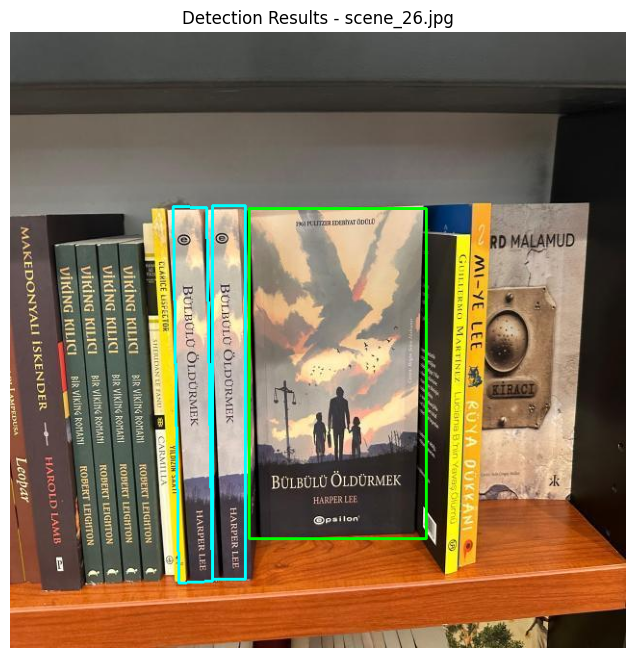


Processing Scene: scene_27.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 0 instance(s) found:
  Book 2 (model_2.png) - 3 instance(s) found:
    Instance 1 {top_left: (np.float32(257.66666), np.float32(146.0)), top_right: (np.float32(303.0), np.float32(146.33333)), bottom_right: (np.float32(303.0), np.float32(564.0)), bottom_left: (np.float32(257.66666), np.float32(564.0)), area: 169694px}
    Instance 2 {top_left: (np.float32(306.66666), np.float32(60.0)), top_right: (np.float32(369.33334), np.float32(103.666664)), bottom_right: (np.float32(352.0), np.float32(572.0)), bottom_left: (np.float32(296.33334), np.float32(594.6667)), area: 268265px}
    Instance 3 {top_left: (np.float32(368.0), np.float32(162.33333)), top_right: (np.float32(418.33334), np.float32(89.333336)), bottom_right: (np.float32(402.33334), np.float32(582.0)), bottom_left: (np.float32(357.33334), np.float32(571.6667)), area: 190523px}
  Book 3 (model_3.png) - 2 instance(s) found:
    Instan

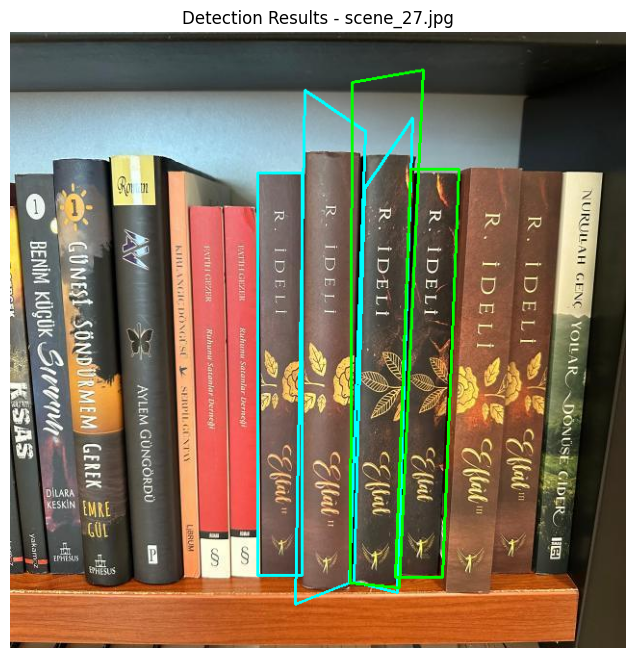


Processing Scene: scene_28.jpg
  Book 0 (model_0.png) - 0 instance(s) found:
  Book 1 (model_1.png) - 2 instance(s) found:
    Instance 1 {top_left: (np.float32(207.0), np.float32(248.0)), top_right: (np.float32(236.0), np.float32(248.0)), bottom_right: (np.float32(236.0), np.float32(554.6667)), bottom_left: (np.float32(207.0), np.float32(554.6667)), area: 79543px}
    Instance 2 {top_left: (np.float32(237.66667), np.float32(246.33333)), top_right: (np.float32(265.33334), np.float32(245.66667)), bottom_right: (np.float32(265.33334), np.float32(551.6667)), bottom_left: (np.float32(237.66667), np.float32(552.0)), area: 76245px}
  Book 2 (model_2.png) - 0 instance(s) found:
  Book 3 (model_3.png) - 0 instance(s) found:
  Book 4 (model_4.png) - 0 instance(s) found:
  Book 5 (model_5.png) - 0 instance(s) found:
  Book 6 (model_6.png) - 0 instance(s) found:
  Book 7 (model_7.png) - 0 instance(s) found:
  Book 8 (model_8.png) - 0 instance(s) found:
  Book 9 (model_9.png) - 0 instance(s) foun

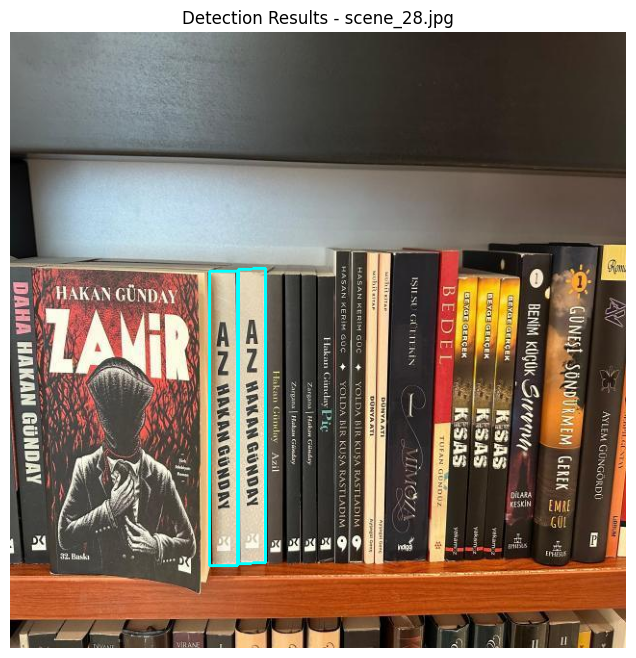

In [28]:
scale_factor = 3.0

models = dict(sorted(models.items(), key=lambda x: natural_sort_key(x[0])))
scenes = dict(sorted(scenes.items(), key=lambda x: natural_sort_key(x[0])))

# Colors are in BGR (then we convert the image in RGB)
colors = [
    (255, 255, 0),   # Cyan
    (0, 255, 0),     # Green
    (0, 0, 255),     # Red
    (255, 0, 255)    # Fuchsia
]
for scene_name, scene_gray in scenes.items():
    i = 0
    # Load color copy for drawing bounding boxes for the current scene
    scene_color = cv2.imread(os.path.join(scenes_path, scene_name))

    print(f"\nProcessing Scene: {scene_name}")

    for model_name, model_img in models.items():

        instances = detect_instances_sift(model_img, scene_gray)

        # Print results
        book_number = int(os.path.splitext(model_name)[0].split("_")[1])
        print(f"  Book {book_number} ({model_name}) - {len(instances)} instance(s) found:")

        if not instances:
          continue

        for j, inst in enumerate(instances, 1):
            # Scale coordinates back
            pts = np.array(inst["corners"], dtype=np.float32) / scale_factor

            print(f"    Instance {j} {{"
                  f"top_left: {tuple(pts[0])}, "
                  f"top_right: {tuple(pts[1])}, "
                  f"bottom_right: {tuple(pts[2])}, "
                  f"bottom_left: {tuple(pts[3])}, "
                  f"area: {inst['area']}px}}")

            # Draw bounding box on the color scene
            pts_array = np.array(pts, dtype=np.int32).reshape((-1, 1, 2))
            cv2.polylines(scene_color, [pts_array], True, colors[i], 2)
        if i < len(colors) - 1:
          i += 1

    # Show results for the current scene
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(scene_color, cv2.COLOR_BGR2RGB))
    plt.title(f"Detection Results - {scene_name}")
    plt.axis("off")
    plt.show()